In [8]:
import geopandas as gpd, pandas as pd
from classes import SubdivisionMeasureEDA
import plotly.offline as pyo
pyo.init_notebook_mode()
pd.set_option('display.float_format', '{:,.0f}'.format)

Access to public transit for each subdivision is measured using Walk Score’s Transit Score methodology. Transit Score quantifies transit accessibility by assessing the “usefulness” of nearby transit services, assigning higher weights to more frequent routes and higher-capacity modes such as rail. For each transit line, usefulness is further adjusted by the distance to the nearest stop using a decay function that reduces the contribution of stops that are farther away. The usefulness values of all nearby routes are then aggregated and normalized into a 0–100 scale.

In [9]:
ABT = gpd.read_file("../../../../Data/Final_dataset/ABT/ABT.gpkg", layer="subdivisions")
building_footprint_dataset= gpd.read_file('../../../../Data/Final_dataset/ABT/outputs_building_overlap/Final_Buildings_SemanticIntegrated.gpkg', columns=["geometry"]).to_crs(ABT.crs)
meck_bo = gpd.read_file("../../../../Data/Original_dataset/Archive/mecklenburgcounty_boundary/MecklenburgCounty_Boundary.shp").to_crs(ABT.crs)

ABT["area_acre"] = ABT.geometry.area / 43560
ABT = ABT[(ABT['year'] >= 1990) & (ABT['year'] <= 2023)]

## __EDA of the 9th measure (Access to public transit)__

## __Source: Walkscore__


Summary for 'transit_ws':
count   5,844
mean       22
std        20
min         0
25%         0
50%        26
75%        36
max        78
Name: transit_ws, dtype: float64
Median: 26.0000
Missing: 0 (0.00%)


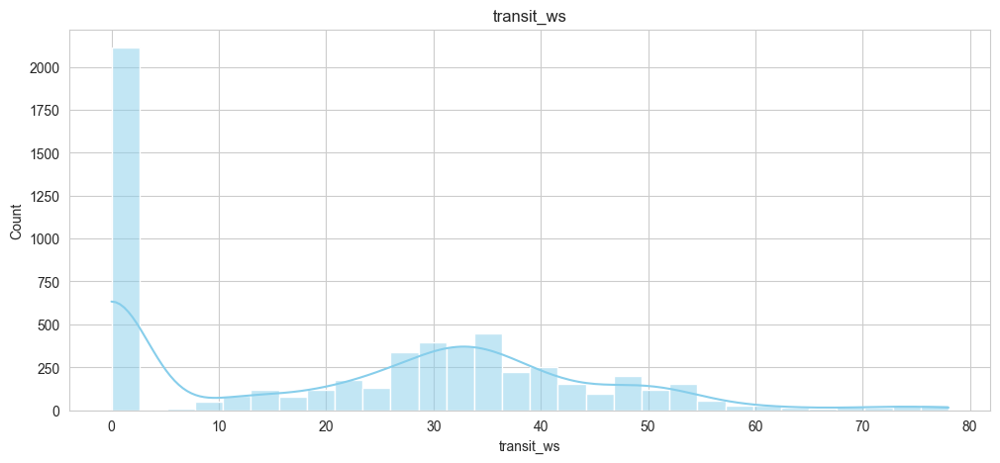

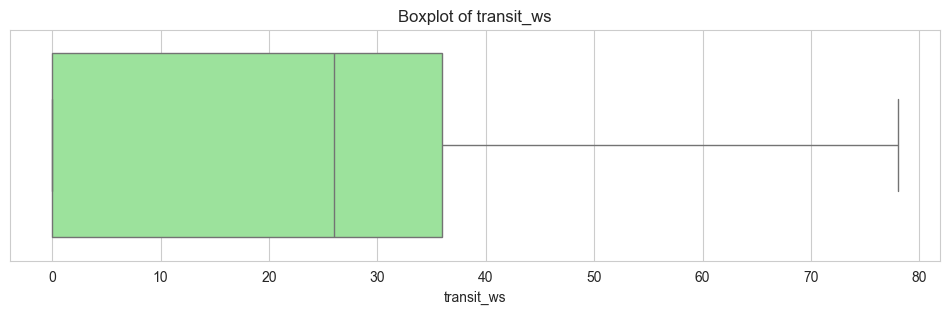

In [10]:
# ----------------------------
# EDA of APT
# ----------------------------
measure_APT = SubdivisionMeasureEDA(ABT, "transit_ws")
measure_APT.summary_stats()
measure_APT.plot_yearly_index()
outliers = measure_APT.detect_outliers()
yearly_stats = measure_APT.yearly_trends()
measure_APT.plot_distribution()

# ----------------------------
# Main Folium map
# ----------------------------
map_APT = measure_APT.folium_map()

# ----------------------------
# Display
# ----------------------------
# folium.LayerControl(collapsed=False).add_to(map_APT)
display(map_APT)

In [11]:
measure_APT.missing_analysis()

✔ No missing transit_ws values found.


## __Source: OSM__


In [12]:
!jupyter nbconvert --to html --no-input EDA_9th.ipynb --output ../../../../output/Notebook_Outputs/EDA_9th.html

[NbConvertApp] Converting notebook EDA_9th.ipynb to html
[NbConvertApp] Writing 18757289 bytes to ..\..\..\..\output\Notebook_Outputs\EDA_9th.html
